#YOLOv5

### Installation Yolov5

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
#temporary until bug is fixed in current master
!git reset --hard 5ba1de0cdcc414c69ceb7a4c45eb1e3895eca32a
%cd /content

!pip install -r yolov5/requirements.txt  # install dependencies

from IPython.display import clear_output
clear_output()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
%cd /content/yolov5/
!python detect.py --source '/content/drive/My Drive/ML_projects/CNN/YOLOv5/Install_1stTrain/Images' --weights '/content/drive/My Drive/ML_projects/CNN/YOLOv5/yolov5x.pt' --conf 0.4
# python detect.py - source folder of images - weight - use weight pre-trained (yolov5x.pt) with Coco images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='/content/drive/My Drive/ML_projects/CNN/YOLOv5/Install_1stTrain/Images', update=False, view_img=False, weights='/content/drive/My Drive/ML_projects/CNN/YOLOv5/yolov5x.pt')
Using CPU

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:657: SourceChangeWarning: source code of class 'models.yolo.Model' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
image 1/10 /content/drive/My Drive/ML_projects/CNN/YOLOv5/Install_1stTrain/Images/Copie de competitions_20009_1097631_test_000172d1dd1adce0.jpg: 448x640 Done. (2.580s)
image 2/10 /content/drive/My Drive/ML_projects/CNN/YOLOv5/Install_1stTrain/Images/Copie de competitions_200

In [ ]:
ls '/content/yolov5/inference/output'

'Copie de competitions_20009_1097631_test_000172d1dd1adce0.jpg'
'Copie de competitions_20009_1097631_test_0005339c44e6071b.jpg'
'Copie de competitions_20009_1097631_test_001467b96c529315.jpg'
'Copie de competitions_20009_1097631_test_002060b1d41fa170.jpg'
'Copie de competitions_20009_1097631_test_002277d1ce0cf94c.jpg'
'Copie de competitions_20009_1097631_test_0022c8c9cc26399b.jpg'
'Copie de competitions_20009_1097631_test_0027d4dec1332aab.jpg'
'Copie de competitions_20009_1097631_test_002827af1ae34622.jpg'
'Copie de competitions_20009_1097631_test_00302fd3aff3344f.jpg'
'Copie de competitions_20009_1097631_test_0036de176ca87c90.jpg'


In [ ]:
'''
#display inference on ALL test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")
'''

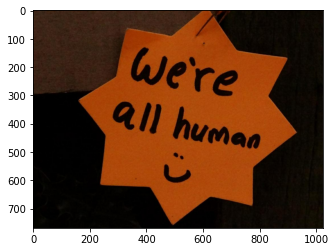

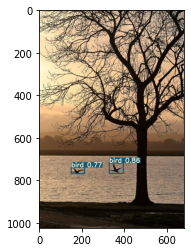

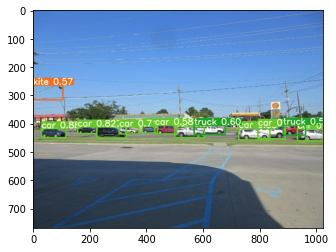

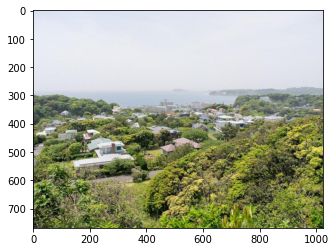

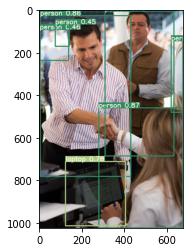

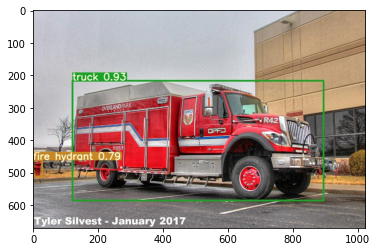

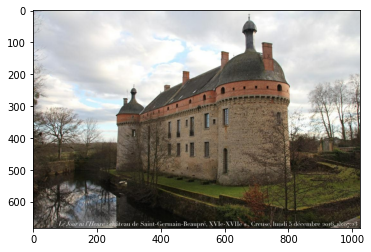

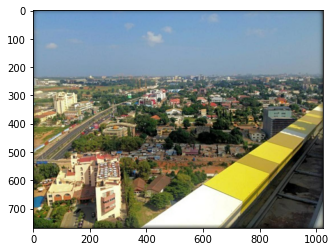

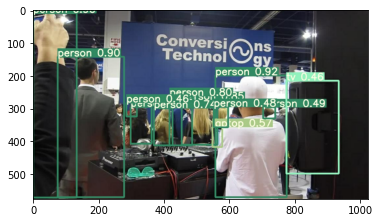

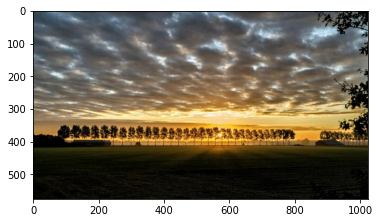

In [ ]:
import glob

for img_path in glob.glob('/content/yolov5/inference/output/*.jpg'):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)
    plt.imshow(img)
    plt.show()

In [ ]:
cp /content/yolov5/inference/output/* '/content/drive/My Drive/ML_projects/CNN/YOLOv5/Install_1stTrain/Image_out'

#Video

In [ ]:
!python detect.py --source '/content/drive/My Drive/ML_projects/CNN/YOLOv5/Video/classement_Longines_Paris_2019.mp4' --output video_out/ --weights weights/yolov5s.pt --conf-thres 0.4

In [ ]:
ls

data/       hubconf.py  models/            test.py         utils/      yolov5/
detect.py   inference/  README.md*         train.py        video_out/
Dockerfile  LICENSE     requirements.txt*  tutorial.ipynb  weights/


In [ ]:
ls video_out/

classement_Longines_Paris_2019.mp4


In [ ]:
cp video_out/classement_Longines_Paris_2019.mp4 '/content/drive/My Drive/ML_projects/CNN/YOLOv5/Video_out'

#TRAIN on a custom set

In [ ]:
#The best pratice is to put the dataset on directory above the yolov5 repo
%cd /content/

#Download dataset link 
!curl -L "https://public.roboflow.ai/ds/Sq1rlrC1yd?key=4Jwct1YSf5" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

clear_output()

In [ ]:
ls train

images/  labels/


In [ ]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 30
names: ['Apple Scab Leaf', 'Apple leaf', 'Apple rust leaf', 'Bell_pepper leaf spot', 'Bell_pepper leaf', 'Blueberry leaf', 'Cherry leaf', 'Corn Gray leaf spot', 'Corn leaf blight', 'Corn rust leaf', 'Peach leaf', 'Potato leaf early blight', 'Potato leaf late blight', 'Potato leaf', 'Raspberry leaf', 'Soyabean leaf', 'Soybean leaf', 'Squash Powdery mildew leaf', 'Strawberry leaf', 'Tomato Early blight leaf', 'Tomato Septoria leaf spot', 'Tomato leaf bacterial spot', 'Tomato leaf late blight', 'Tomato leaf mosaic virus', 'Tomato leaf yellow virus', 'Tomato leaf', 'Tomato mold leaf', 'Tomato two spotted spider mites leaf', 'grape leaf black rot', 'grape leaf']

# Divide to train & validation set (images + labels)

In [ ]:
from pathlib import Path 
import glob

root_dir = Path('/content/')

image_path = [str(img_path) for img_path in root_dir.glob('train/images/*.jpg')]
label_path = [str(lab_path) for lab_path in root_dir.glob('train/labels/*.txt')]
dataset_size = len(image_path)

Random choice images to mouve to VALID folder

In [ ]:
import random

valid_size = int(0.2*dataset_size)

valid_image_path = random.sample(image_path, valid_size)
valid_image_path[:3]

['/content/train/images/tylc_jpg.rf.eb21735224818275f843d00485779f80.jpg',
 '/content/train/images/powdery-mildew-pea-leaf_jpg.rf.11b24c6e790c402250685e189a63dcf7.jpg',
 '/content/train/images/dscf9038_jpg.rf.83e640749a1f4705998549da84991718.jpg']

Find the labels of validation images

In [ ]:
import re

def take_label_path(img_path):
    label_path = img_path[:-3] + str('txt')
    #label_path = re.sub('.jpg', '', img_path) + str('.txt')
    label_path = label_path.replace('images', 'labels')
    return label_path

valid_label_path = list(map(take_label_path, valid_image_path))
valid_label_path[:3]

['/content/train/labels/tylc_jpg.rf.eb21735224818275f843d00485779f80.txt',
 '/content/train/labels/powdery-mildew-pea-leaf_jpg.rf.11b24c6e790c402250685e189a63dcf7.txt',
 '/content/train/labels/dscf9038_jpg.rf.83e640749a1f4705998549da84991718.txt']

In [ ]:
#Create Valid -> images, labels folders
VALID_IMAGE = '/content/valid/images'
VALID_LABEL = '/content/valid/labels'

path = Path(VALID_IMAGE)
path.mkdir(parents=True, exist_ok=True)

path = Path(VALID_LABEL)
path.mkdir(parents=True, exist_ok=True)

Mouve images to valid/images folder

In [ ]:
import shutil
for img in valid_image_path:
    shutil.move(img, VALID_IMAGE)

In [ ]:
for lab in valid_label_path:
    shutil.move(lab, VALID_LABEL)

# Define Model Configuration and Architecture
We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [ ]:
#custom yaml : change number of classes in yolov5s.yaml
from google.colab import files
files.upload()

Saving custom_yolov5s.yaml to custom_yolov5s.yaml


{'custom_yolov5s.yaml': b"# parameters\nnc: 3  # number of classes\ndepth_multiple: 0.33  # model depth multiple\nwidth_multiple: 0.50  # layer channel multiple\n\n# anchors\nanchors:\n  - [116,90, 156,198, 373,326]  # P5/32\n  - [30,61, 62,45, 59,119]  # P4/16\n  - [10,13, 16,30, 33,23]  # P3/8\n\n# YOLOv5 backbone\nbackbone:\n  # [from, number, module, args]\n  [[-1, 1, Focus, [64, 3]],  # 0-P1/2\n   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4\n   [-1, 3, BottleneckCSP, [128]],\n   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8\n   [-1, 9, BottleneckCSP, [256]],\n   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16\n   [-1, 9, BottleneckCSP, [512]],\n   [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32\n   [-1, 1, SPP, [1024, [5, 9, 13]]],\n  ]\n\n# YOLOv5 head\nhead:\n  [[-1, 3, BottleneckCSP, [1024, False]],  # 9\n\n   [-1, 1, Conv, [512, 1, 1]],\n   [-1, 1, nn.Upsample, [None, 2, 'nearest']],\n   [[-1, 6], 1, Concat, [1]],  # cat backbone P4\n   [-1, 3, BottleneckCSP, [512, False]],  # 13\n\n   [-1, 1, Conv, [256, 1,

In [ ]:
cp custom_yolov5s.yaml '/content/yolov5/models'

Train yolo5 on custom data -> output : weight

In [ ]:
%%time
%cd /content/yolov5/

!python train.py --batch 16 --epochs 50 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weight '' --name PlantDoc_results #--nosave --cache


/content/yolov5
Apex recommended for faster mixed precision training: https://github.com/NVIDIA/apex
{'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.58, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.014, 'hsv_s': 0.68, 'hsv_v': 0.36, 'degrees': 0.0, 'translate': 0.0, 'scale': 0.5, 'shear': 0.0}
Your branch is behind 'origin/master' by 180 commits, and can be fast-forwarded.
  (use "git pull" to update your local branch)

Namespace(adam=False, batch_size=16, bucket='', cache_images=False, cfg='./models/custom_yolov5s.yaml', data='../data.yaml', device='', epochs=50, evolve=False, img_size=[640, 640], multi_scale=False, name='PlantDoc_results', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, weights='')
Using CUDA device0 _CudaDeviceProperties(name='Tesla K80', total_memory=11441MB)

2020-07-18 13:32:44.749754: I tensorflow/stream_executor/platform/default/ds

# Evaluate Custom YOLOv5 Detector Performance
* Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the --name flag when we train. In our case, we named this yolov5s_results. (If given no name, it defaults to results.txt.) The results file is plotted as a png after training completes.

* Note from Glenn: Partially completed results.txt files can be plotted with from utils.utils import plot_results; plot_results().

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

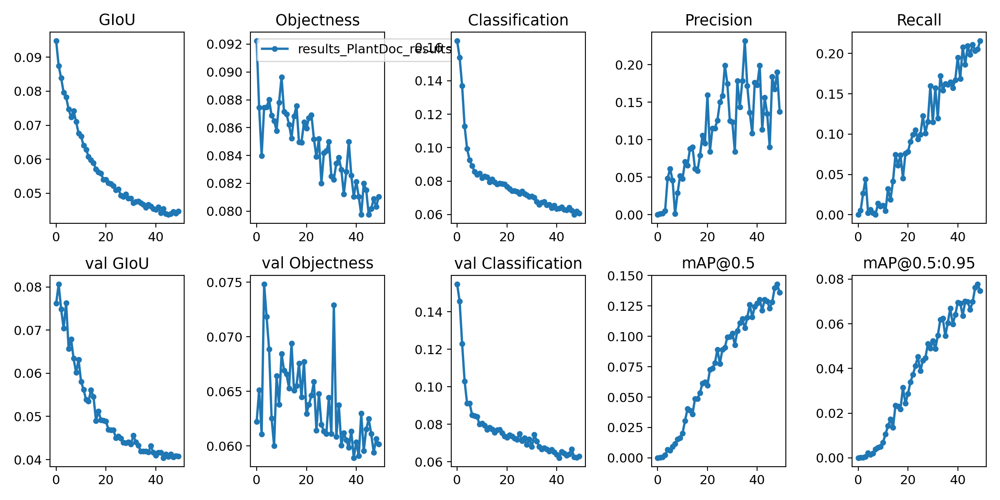

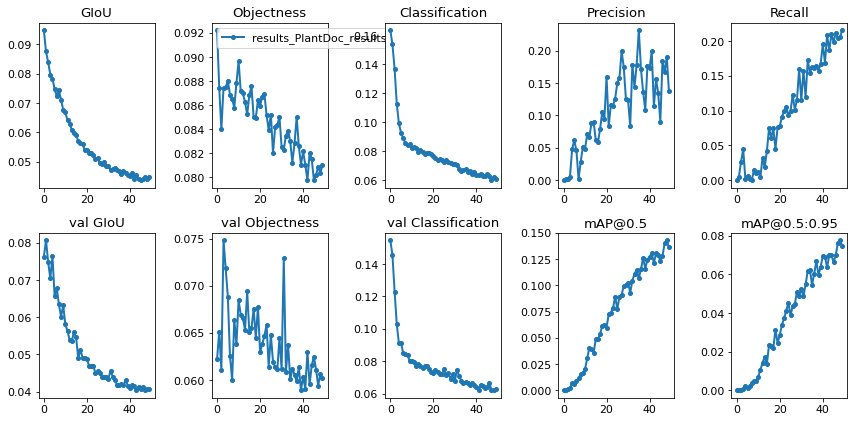

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.utils import plot_results 
from IPython.display import Image, display

plot_results()  # plot results.txt as results.png

Image(filename='./results.png', width=1000)  # view results.png

#Visualize  Training Data with Labels
* After training starts, view train*.jpg images to see training images, labels and augmentation effects.

GROUND TRUTH TRAINING DATA:


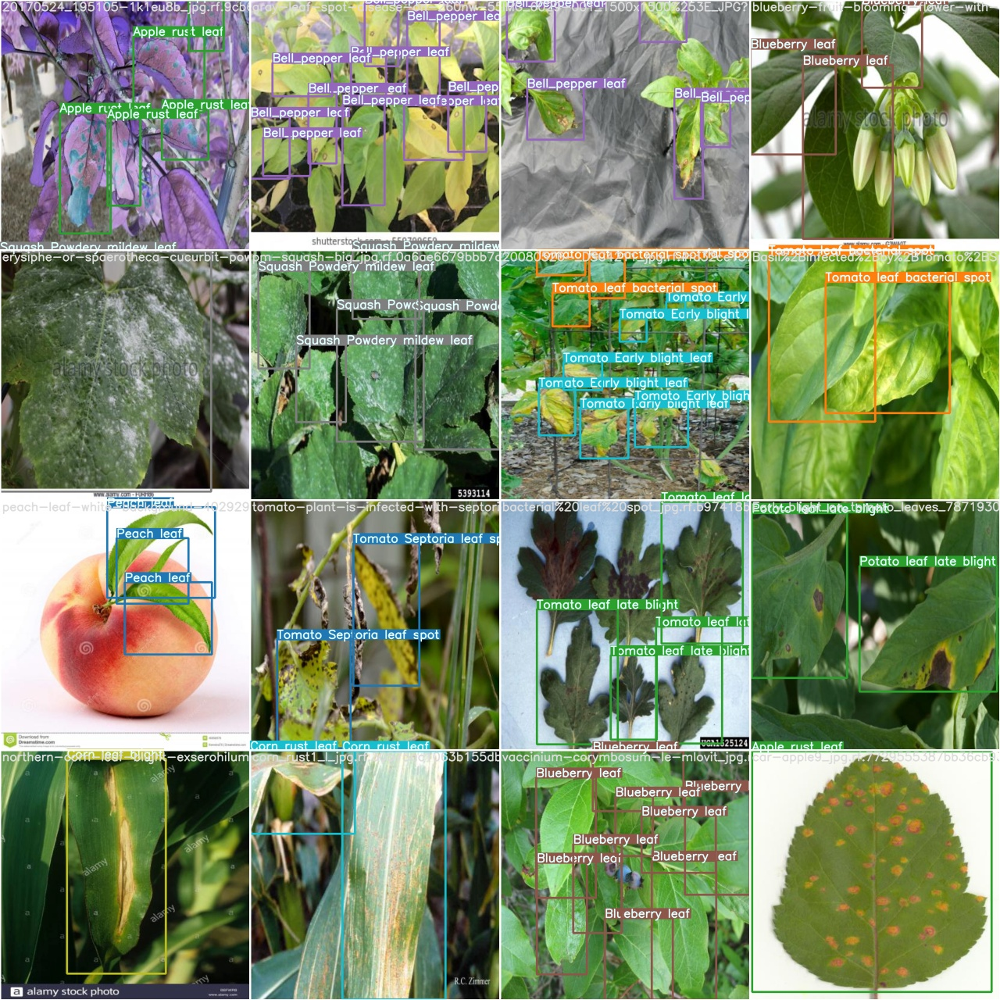

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='./test_batch0_gt.jpg', width=900)

GROUND TRUTH TRAINING DATA:


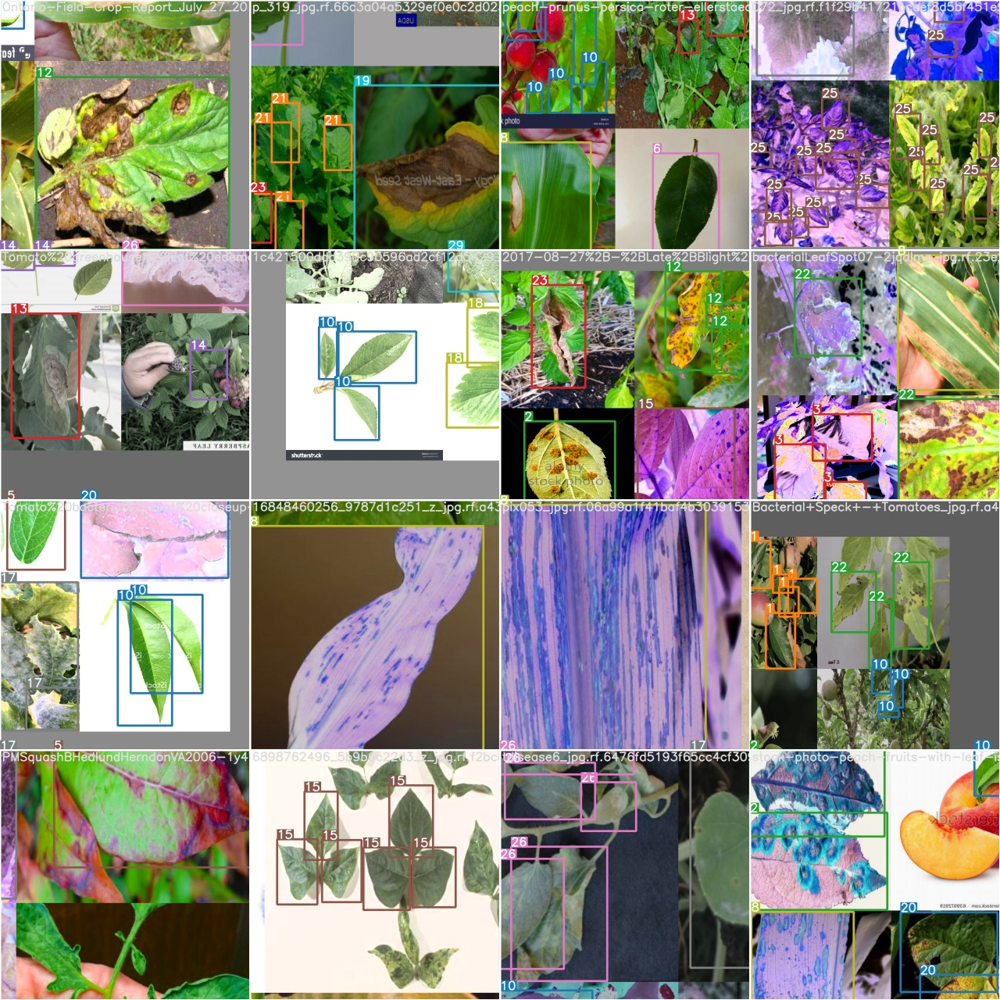

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='./train_batch2.jpg', width=900)

#Run Inference With Trained Weights
Run inference with a pretrained checkpoint on contents of test/images folder downloaded from Roboflow.

In [ ]:
# trained weights are saved by default in our weights folder
%ls weights/

best_PlantDoc_results.pt  download_weights.sh*  last_PlantDoc_results.pt


In [ ]:
%cd /content/yolov5/
!python detect.py --weights weights/best_PlantDoc_results.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='../test/images', update=False, view_img=False, weights='weights/best_PlantDoc_results.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla K80', total_memory=11441MB)

image 1/239 ../test/images/%2320+Bacterial+Spot+and+Speck_jpg.rf.56abfa1b8c07239d7a7b67f36649a105.jpg: 416x416 Done. (0.024s)
image 2/239 ../test/images/0000_jpg.rf.7bf8d4c69ad253ee55c87d6e78d1ae28.jpg: 416x416 Done. (0.024s)
image 3/239 ../test/images/000_jpg.rf.79b07e9657b862eca6972264b5e2fe0c.jpg: 416x416 Done. (0.023s)
image 4/239 ../test/images/00_jpg.rf.7fa2b9652948e8c39a51a68ec5c6b70a.jpg: 416x416 Done. (0.024s)
image 5/239 ../test/images/00pe_jpg.rf.42b93f15a0cec3a936d3a236bf71c5a8.jpg: 416x416 Done. (0.023s)
image 6/239 ../test/images/01_jpg.rf.9c39f014290d5a331926f19f5c268200.jpg: 416x416 Done. (0.024s)
image 7/239 ../test/imag

In [ ]:
#from pathlib import Path

TEST_DIR = Path('/content/yolov5/inference/output/')
image_output_path = [str(path) for path in TEST_DIR.glob('*.jpg')]
image_output_path[:2]

['/content/yolov5/inference/output/0c_jpg.rf.94d4e676b19456d693ee4e9884deb97f.jpg',
 '/content/yolov5/inference/output/apple%20scab%20leaf_jpg.rf.1f233f18b404f1313a86d5f2e166293f.jpg']

In [ ]:
n_rows = 2
n_cols = 5
#random_images = random.sample(image_output_path, n_rows * n_cols)
test_images = image_output_path[:n_rows*n_cols]
test_images

['/content/yolov5/inference/output/0c_jpg.rf.94d4e676b19456d693ee4e9884deb97f.jpg',
 '/content/yolov5/inference/output/apple%20scab%20leaf_jpg.rf.1f233f18b404f1313a86d5f2e166293f.jpg',
 '/content/yolov5/inference/output/bugs-and-blight-061_jpg.rf.6df53faa42d69a53cc52c5ca8b1bd023.jpg',
 '/content/yolov5/inference/output/apple%20scabnew_jpg.rf.af669e1b2d4146e65f74b704ae3dd009.jpg',
 '/content/yolov5/inference/output/pepper_leaf_jpg.rf.640d343dbc67248cb1ad15cc5c07fc72.jpg',
 '/content/yolov5/inference/output/6447731_orig_jpg.rf.85458f4dd3c3ee26dadfe6a18165276b.jpg',
 '/content/yolov5/inference/output/powdery-mildew-erysiphe-plantani-on-young-sycamore-leaves-b774tm_jpg.rf.3de87f7781293b77c6f976f62e1a6fae.jpg',
 '/content/yolov5/inference/output/glyphosate_jpg.rf.01dea2d24a1e3591855a68e077bb625e.jpg',
 '/content/yolov5/inference/output/Common%20Diseases%20Figure%201_JPG_jpg.rf.7c3f25355ca90a1ff37f976c153e37cf.jpg',
 '/content/yolov5/inference/output/black_leaf_mold_in_zina_tina_jpg.rf.9cd74

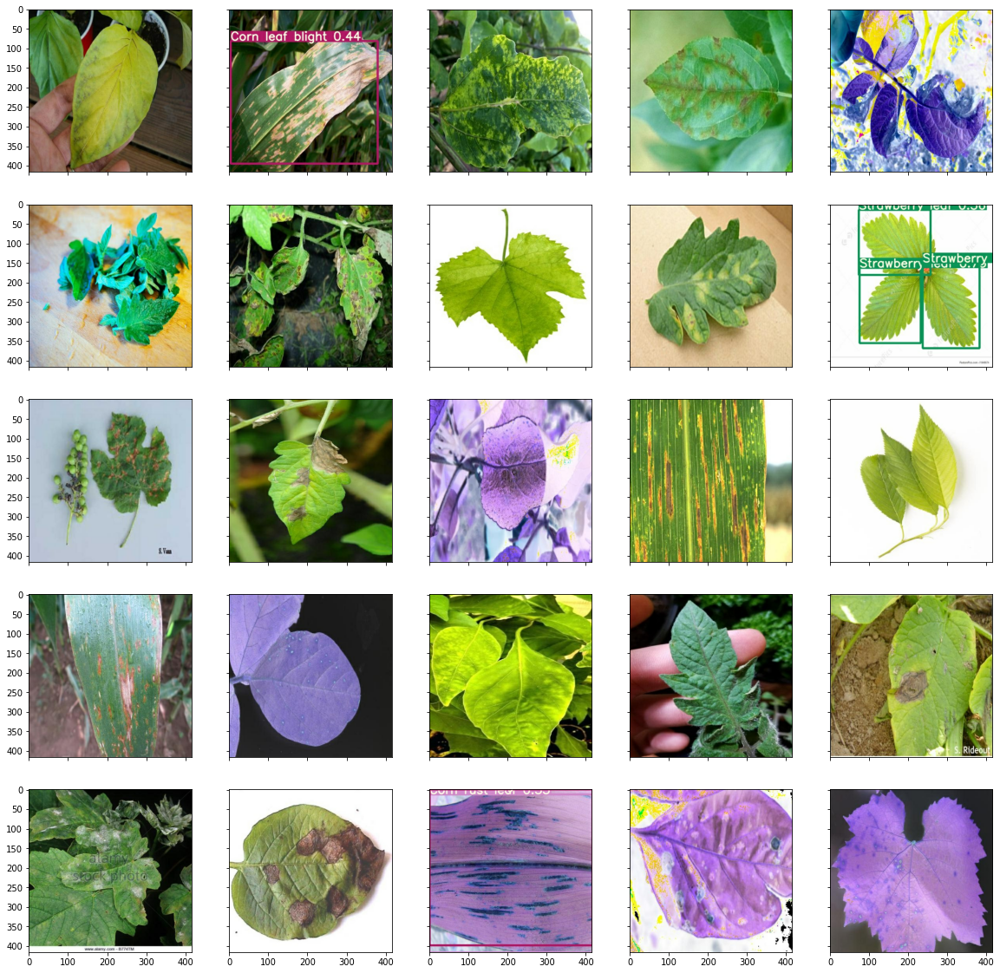

In [ ]:
import random
n_rows = 5
n_cols = 5
test_images = random.sample(image_output_path, n_rows * n_cols)
#test_images = image_output_path[:n_rows*n_cols]

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, sharex=True, sharey=True, figsize=(20,20))
for i, ax in enumerate(axes.flat):
    img = tf.io.read_file(test_images[i])
    img = tf.image.decode_jpeg(img, channels=0)
    ax.imshow(img)
    
plt.show()


#Export Trained Weights for Future Inference
export the trained weights made here for inference on device

In [ ]:
cp 

In [ ]:
'''
%cd /content/yolov5/
!python detect.py --weights '/content/drive/My Drive/ML_projects/CNN/YOLOv5/Plan_leafs/last_PlantDoc_results.pt' --conf 0.4 --source ../test/images
'''